In [1]:
!pip install tensorflow scikit-learn numpy pandas


seprate phones for each test

> in this file, each smple of phones in an experiment, merged with the output of the accurate sensor at hte same experiment.


>  id -> phone id


> input -> mobile signal


> label -> accurate sensor signal


> experiment -> acc(g)-frequency(Hz)

> max -> maximum acceleration in the test


In [ ]:
import pandas as pd
import os
import random
import numpy as np

# Directory containing CSV files
directory = os.getcwd()  # Replace with your directory path

# Loop through all files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        # Read the current CSV file
        file_path = os.path.join(directory, filename)
        df = pd.read_csv(file_path)
        
        for column in df.columns:
            if column != '11':
                df[column] = df[column]

            if column == '11':
                df[column] = df[column]-np.mean(df[column])

        df.to_csv(file_path, index=False)
            

In [ ]:
import pandas as pd
import os
import random
import numpy as np

# Directory containing CSV files
directory = os.getcwd()  # Replace with your directory path

# Loop through all files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        # Read the current CSV file
        file_path = os.path.join(directory, filename)
        df = pd.read_csv(file_path)
        
        for column in df.columns:
            if column != '11':
                df[column] = df[column]

            if column == '11':
                df[column] = df[column]-np.mean(df[column])

        df.to_csv(file_path, index=False)
            

In [3]:
import pandas as pd
import os
import random
import numpy as np


# Directory containing CSV files
directory = os.getcwd()  # Replace with your directory path

# Loop through all files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        # Read the current CSV file
        file_path = os.path.join(directory, filename)
        df = pd.read_csv(file_path)
        
        # Create new empty series for the current file
        combined_series = pd.Series(dtype=object)
        id_series = pd.Series(dtype=object)
        lable_series = pd.Series(dtype=object)
        experiment = pd.Series(dtype=object)
        maximum = pd.Series(dtype=object)
        minimum = pd.Series(dtype=object)

        exp = filename.replace(".csv","")

        # Loop through each column and combine data
        for column in df.columns:
            if column != '11' and column != 'Unnamed: 0':

                combined_series = pd.Series(dtype=object)
                id_series = pd.Series(dtype=object)
                lable_series = pd.Series(dtype=object)
                experiment = pd.Series(dtype=object)
                maximum = pd.Series(dtype=object)
                minimum = pd.Series(dtype=object)
                
                combined_series = combined_series.append(df[column]-np.mean(df[column]), ignore_index=True)
                id_series = id_series.append(pd.Series(column, index=df.index), ignore_index=True)
                lable_series = lable_series.append(df['11'], ignore_index=True)
                experiment =experiment.append(pd.Series(exp, index=df.index), ignore_index=True)
                maximum = maximum.append(pd.Series(np.max(df['11']), index=df.index), ignore_index=True)
                minimum = minimum.append(pd.Series(np.min(df['11']), index=df.index), ignore_index=True)
                #delta= ((np.max(df['11'])- np.mean(df['11']))-(np.max(df[column])-np.mean(df[column])))/(np.max(df[column])-np.mean(df[column]))
                #print(str(column)+"-"+exp+":   "+str(delta))
                #c2=np.max(df[column])+np.min(df[column])
                #c2=np.max(df['11'])+np.min(df['11'])
                
                
                #print(str(column)+"-"+exp+":   "+str(c2))
                # Create a DataFrame from the combined series
                result_df = pd.DataFrame({
                
                    'id': id_series,
                    'experiment' : experiment,                    
                    'input': combined_series,
                    'label': lable_series,
                    'max': maximum,
                    'min': minimum
                })
                #use random name for randomize data or use original to sort by acceleration
                
                # Save the result to a new CSV file with "_comb" suffix
                random_number = random.randint(10000, 99999)
                result_file_path = filename.replace(".csv", "-"+column + "_normalcomb.csv")
                #result_file_path = os.path.join(directory, str(random_number)+ "_normalcomb.csv")
                result_df.to_csv(result_file_path, index=False)

                #print(f"Processed and saved: {random_number}")
                
                


merge all data to one

In [5]:
import pandas as pd
import os

# Directory containing the generated _comb.csv files
directory = os.getcwd()  # Replace with your directory path

# Initialize an empty list to hold DataFrames from each file
dataframes = []

# Loop through all files in the directory to find _comb.csv files
for filename in os.listdir(directory):
    if filename.endswith("_normalcomb.csv"):
        # Read each _comb.csv file
        file_path = os.path.join(directory, filename)
        df = pd.read_csv(file_path)
        
        # Append the DataFrame to the list
        dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame

merged_df = pd.concat(dataframes, ignore_index=True)

# Save the merged DataFrame to a single CSV file
merged_df.to_csv(os.path.join(directory, 'merged_combined33.csv'), index=False)


print("All _comb.csv files have been merged and saved as 'merged_combined.csv'")


All _comb.csv files have been merged and saved as 'merged_combined.csv'


In [2]:
import pandas as pd
import os

# Directory containing the generated _comb.csv files
directory = os.getcwd()  # Replace with your directory path

# Initialize an empty list to hold DataFrames from each file
dataframes = []

# Loop through all files in the directory to find _comb.csv files
for filename in os.listdir(directory):
    if filename.endswith("_normalcomb.csv"):
        # Read each _comb.csv file
        file_path = os.path.join(directory, filename)
        df = pd.read_csv(file_path)
        
        # Append the DataFrame to the list
        dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame

merged_df = pd.concat(dataframes, ignore_index=True)

# Save the merged DataFrame to a single CSV file
merged_df.to_csv(os.path.join(directory, 'merged_combined33.csv'), index=False)


print("All _comb.csv files have been merged and saved as 'merged_combined.csv'")


All _comb.csv files have been merged and saved as 'merged_combined.csv'


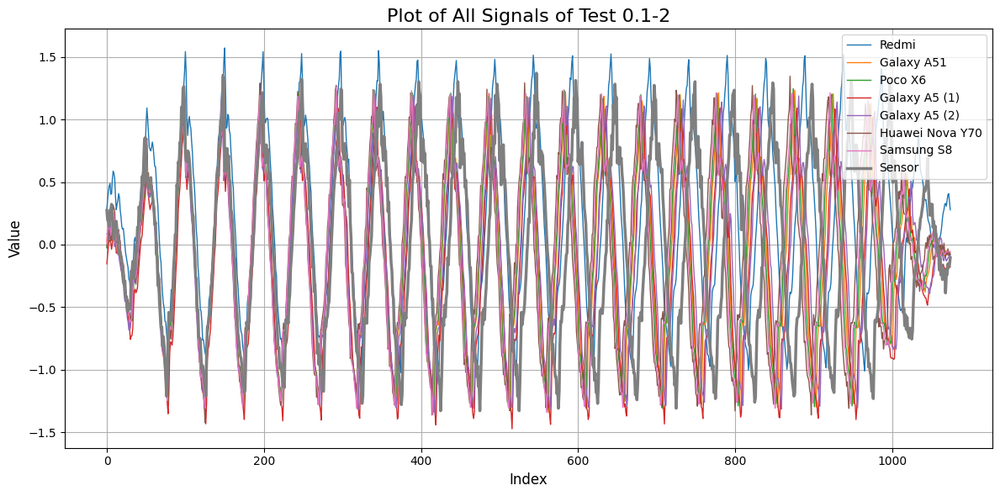

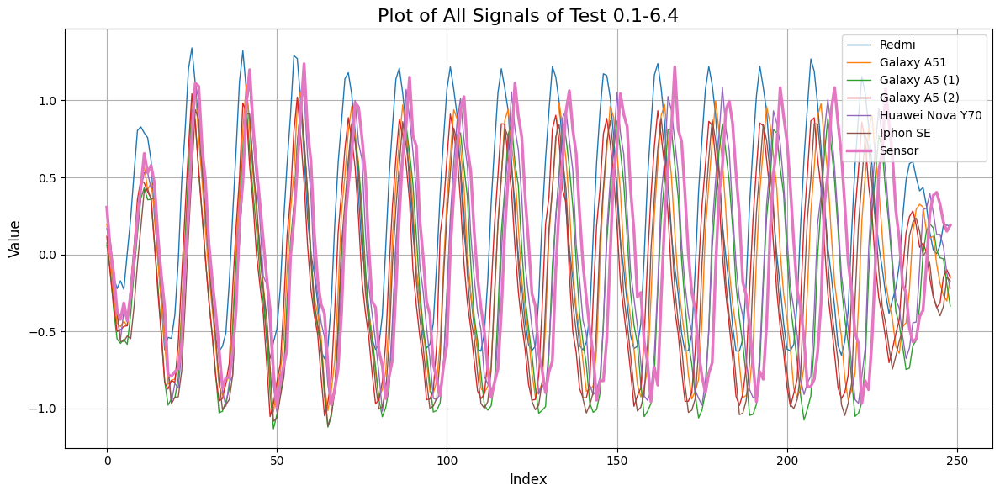

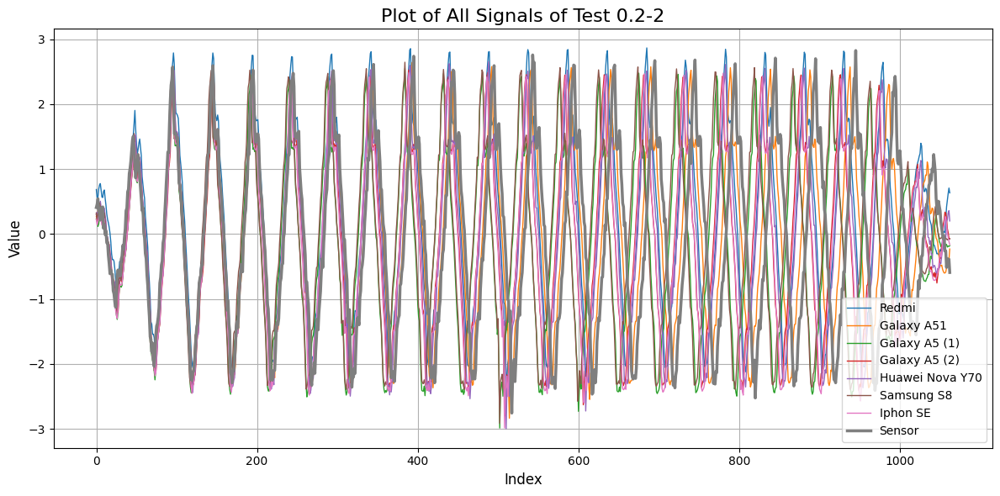

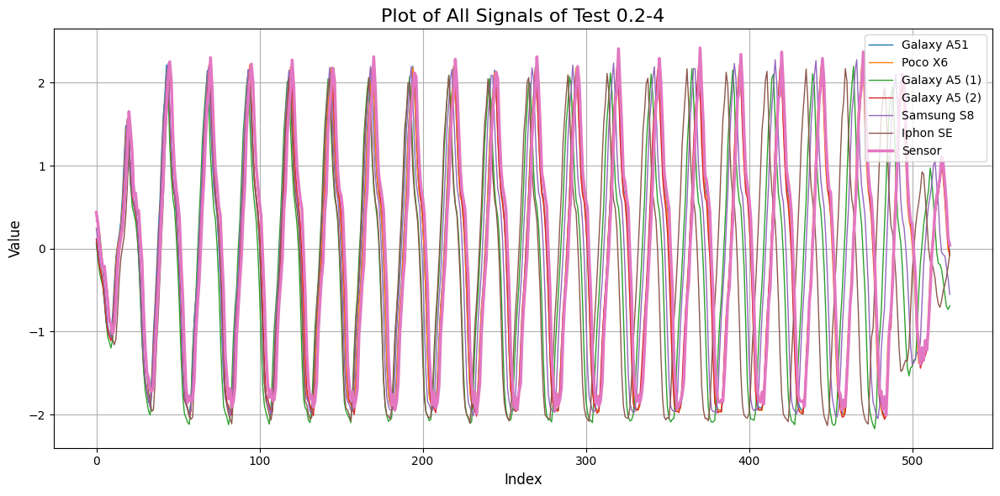

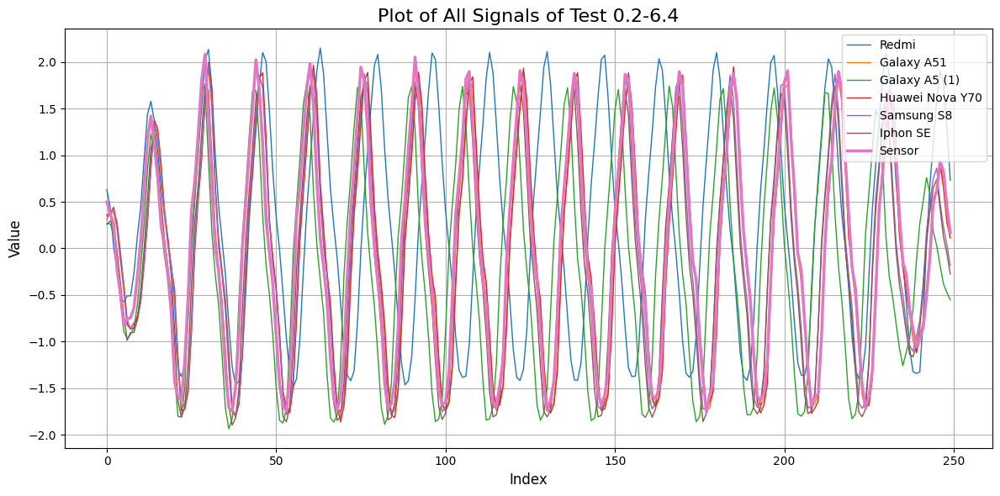

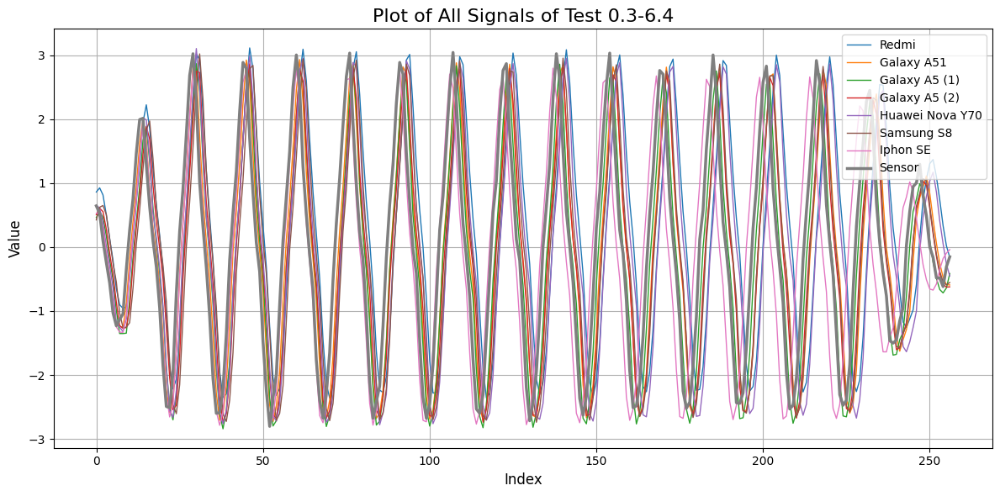

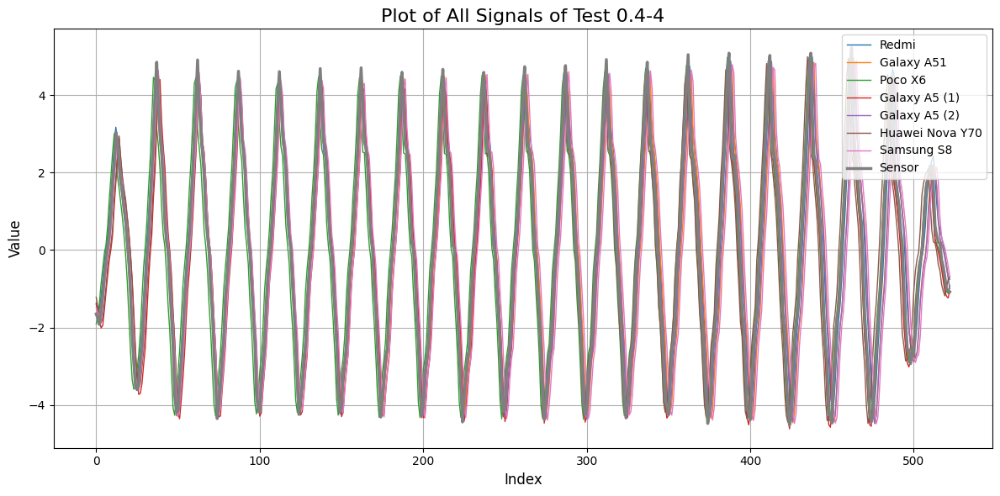

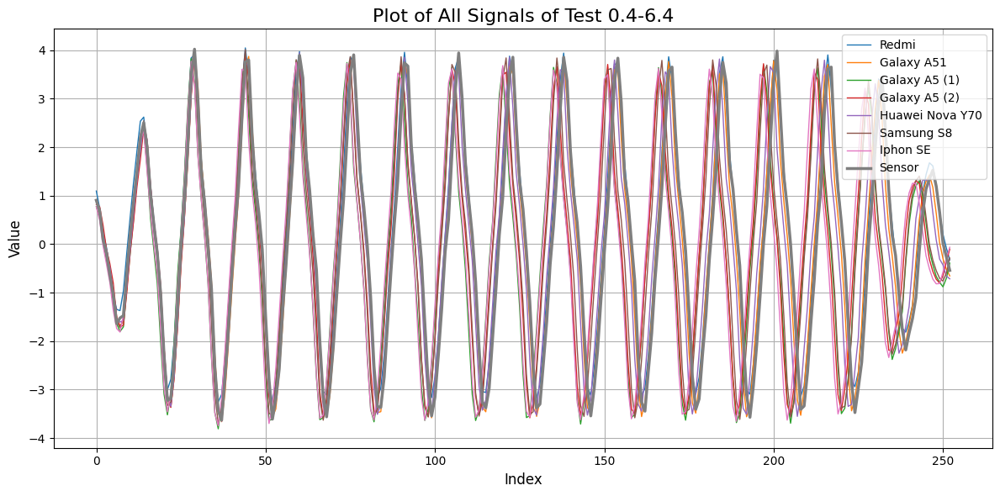

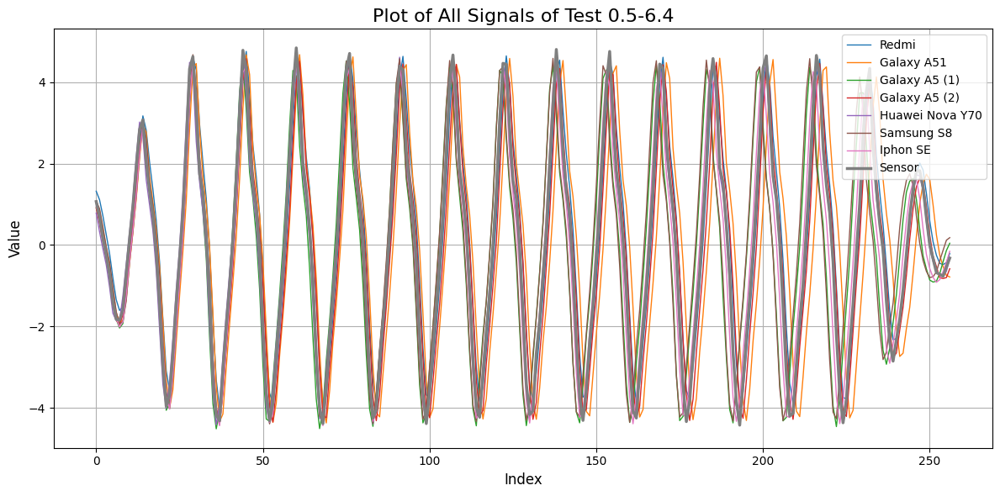

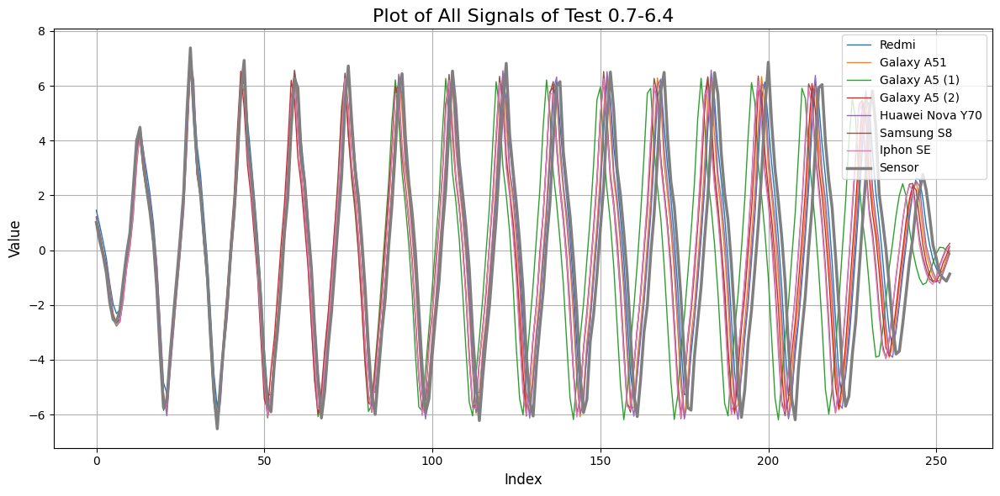

KeyError: 'experiment'

<Figure size 1200x600 with 0 Axes>

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import os

# Directory containing the generated _comb.csv files
directory = os.getcwd()  # Replace with your directory path

# Initialize an empty list to hold DataFrames from each file
dataframes = []

custom_labels = {
    '0': 'Redmi',
    '1': 'Galaxy A51',
    '2': 'Poco X6',
    '3': 'Galaxy A5 (1)',
    '4': 'Galaxy A5 (2)',
    '5': 'Huawei Nova Y70',
    '6': 'Samsung S8',
    '7': 'Iphon SE',
    '11': 'Sensor'
}

# Loop through all files in the directory to find _comb.csv files
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        # Read each _comb.csv file
        file_path = os.path.join(directory, filename)
        data = pd.read_csv(file_path)
        data.head()

        # Set up the plot
        plt.figure(figsize=(12, 6))

        # Plot each column, distinguishing column 0 (integer)
        for col in data.columns[1:]:  # Skip "Unnamed: 0" (index/identifier)
            if col == '11':  # Check for column 0 as an integer
                plt.plot(data[col], label=custom_labels[col], linewidth=2.5)  # Bolder line for column 0
                
            else:
                plt.plot(data[col], label=custom_labels[col], linewidth=1)

        # Add labels, legend, and grid
        plt.title('Plot of All Signals of Test '+filename.replace('.csv', ''), fontsize=16)
        plt.xlabel('Index', fontsize=12)
        plt.ylabel('Value', fontsize=12)

        # Explicitly call legend()
        plt.legend(loc='best')  # 'best' will automatically choose the best location for the legend
        plt.grid(True)
        plt.tight_layout()

        # Show the plot
        plt.show()




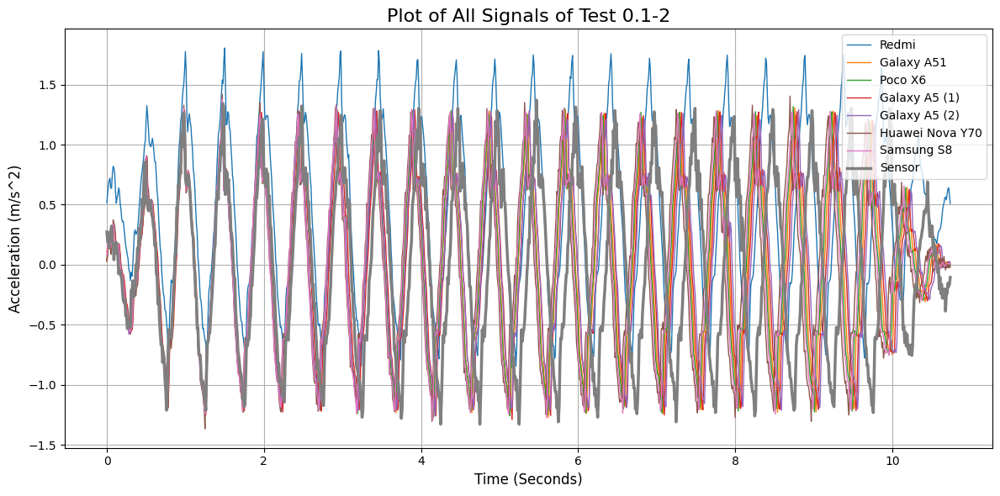

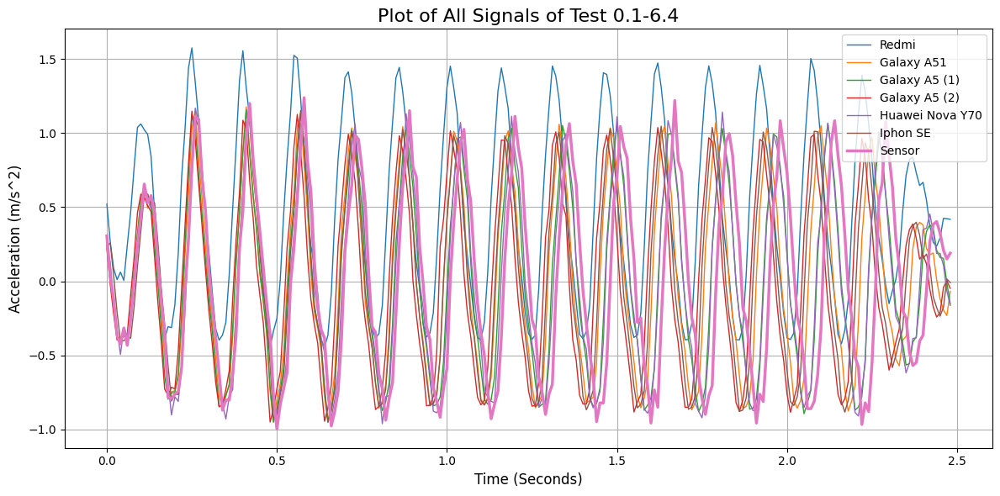

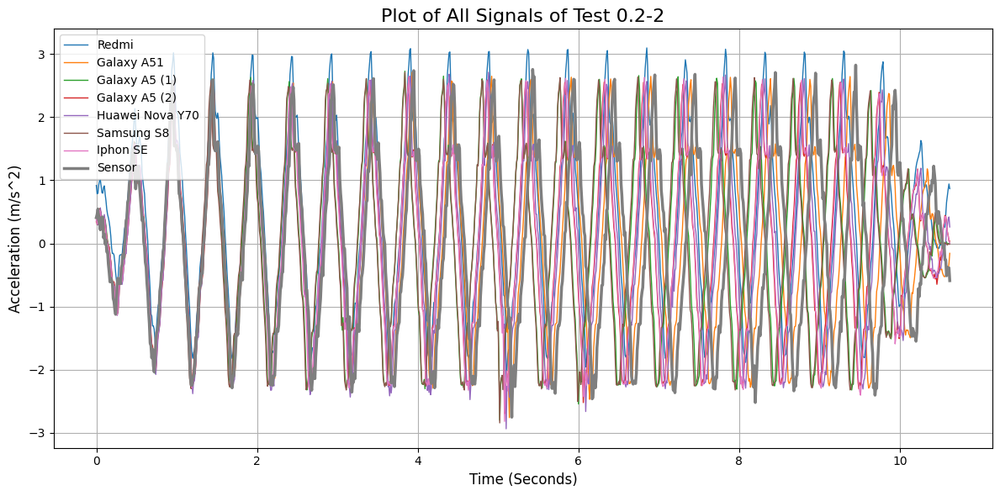

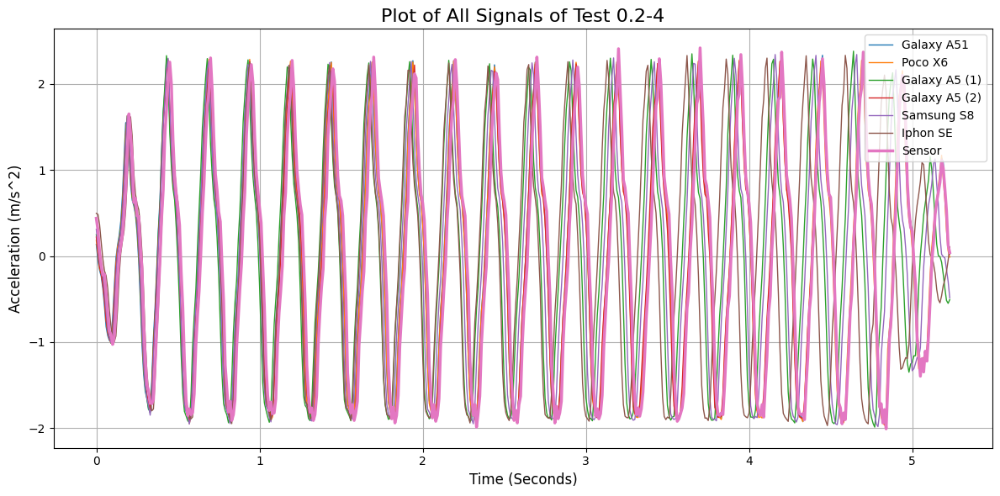

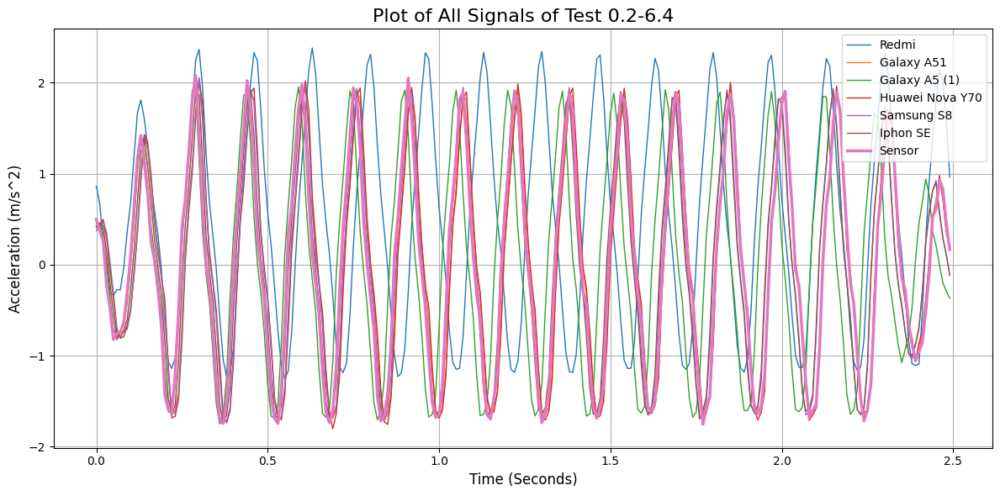

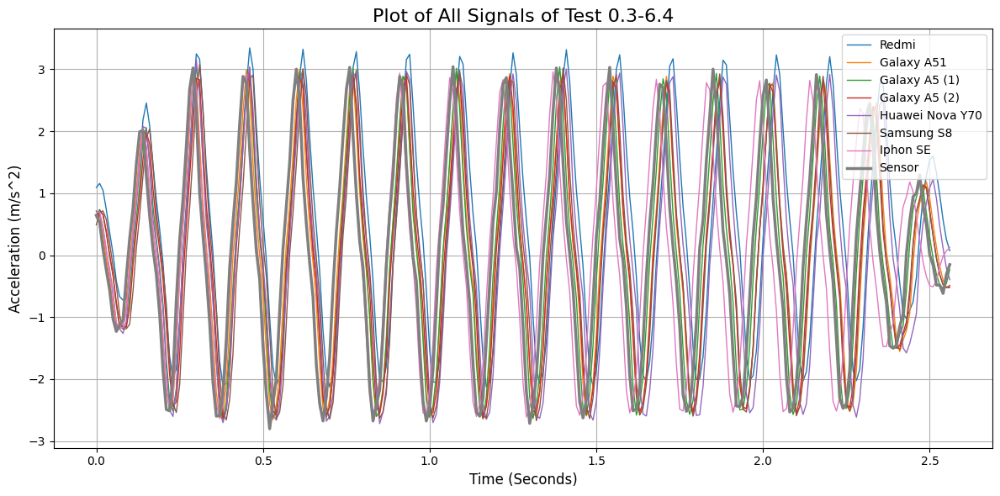

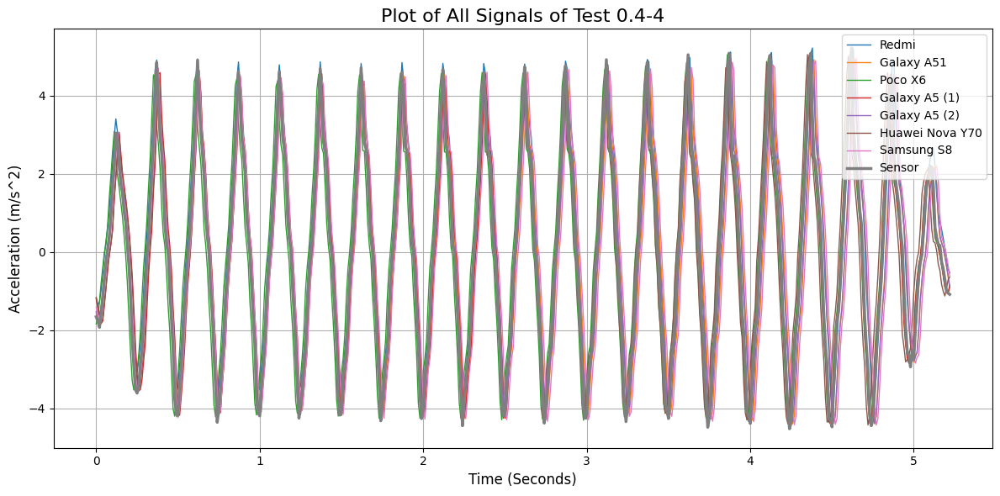

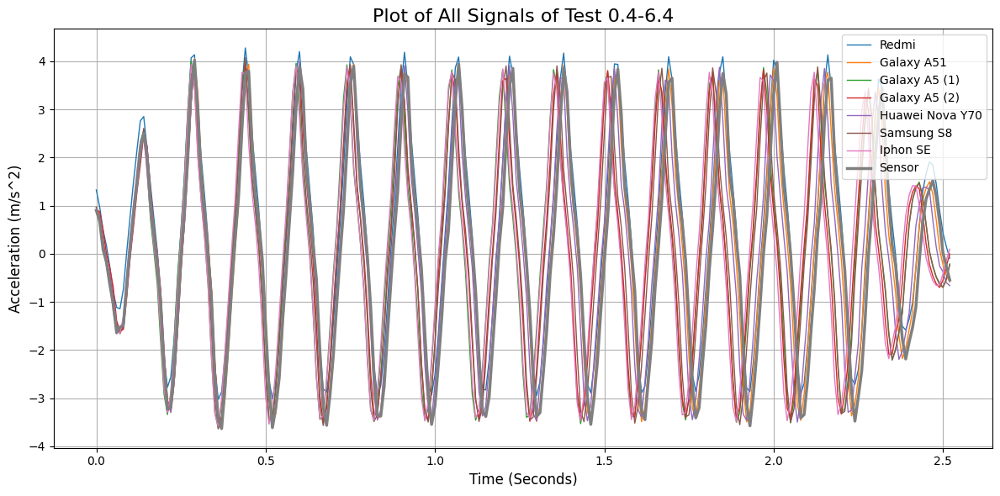

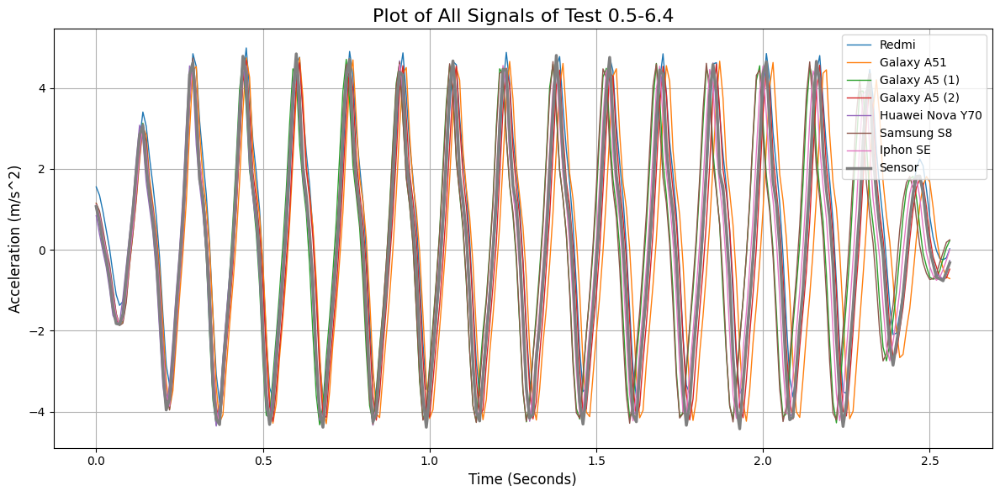

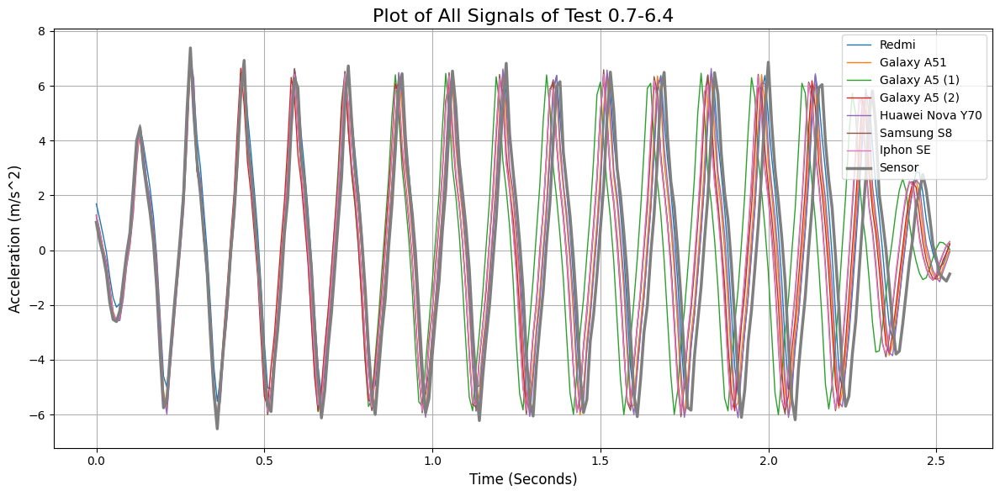

KeyError: 'experiment'

<Figure size 1200x600 with 0 Axes>

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

# Directory containing the generated _comb.csv files
directory = os.getcwd()  # Replace with your directory path

# Initialize an empty list to hold DataFrames from each file
dataframes = []

custom_labels = {
    '0': 'Redmi',
    '1': 'Galaxy A51',
    '2': 'Poco X6',
    '3': 'Galaxy A5 (1)',
    '4': 'Galaxy A5 (2)',
    '5': 'Huawei Nova Y70',
    '6': 'Samsung S8',
    '7': 'Iphon SE',
    '11': 'Sensor'
}

mean = {
    '0': 0.233,
    '1': 0.072,
    '2': 0.071,
    '3': 0.183,
    '4': 0.104,
    '5': 0.058,
    '6': 0.066,
    '7': 0.163,
    '11': 0
}

# Loop through all files in the directory to find _comb.csv files
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        # Read each _comb.csv file
        file_path = os.path.join(directory, filename)
        data = pd.read_csv(file_path)

        # Assume the first column represents time
        time_values = data.iloc[:, 0] * 0.01  # Multiply time values by 100

        # Set up the plot
        plt.figure(figsize=(12, 6))

        # Plot each column, distinguishing column '11'
        for col in data.columns[1:]:  # Skip the first column (time or index)
            if col == '11':  # Check for column '11' specifically
                plt.plot(time_values, data[col] + mean[col], label=custom_labels[col], linewidth=2.5)  # Bolder line
            else:
                plt.plot(time_values, data[col] + mean[col], label=custom_labels[col], linewidth=1)

        # Add labels, legend, and grid
        plt.title('Plot of All Signals of Test ' + filename.replace('.csv', ''), fontsize=16)
        plt.xlabel('Time (Seconds)', fontsize=12)
        plt.ylabel('Acceleration (m/s^2)', fontsize=12)

        # Explicitly call legend()
        plt.legend(loc='best')  # 'best' will automatically choose the best location for the legend
        plt.grid(True)
        plt.tight_layout()

        # Show the plot
        plt.show()


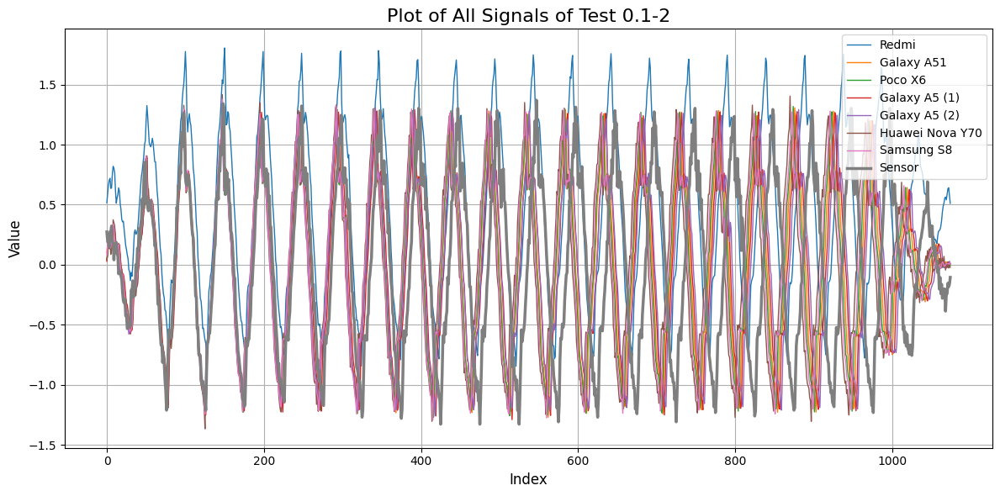

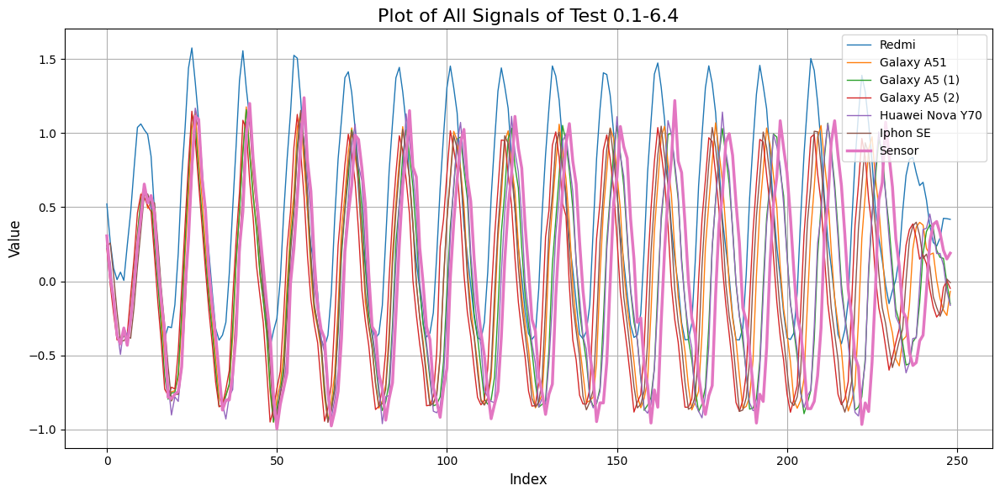

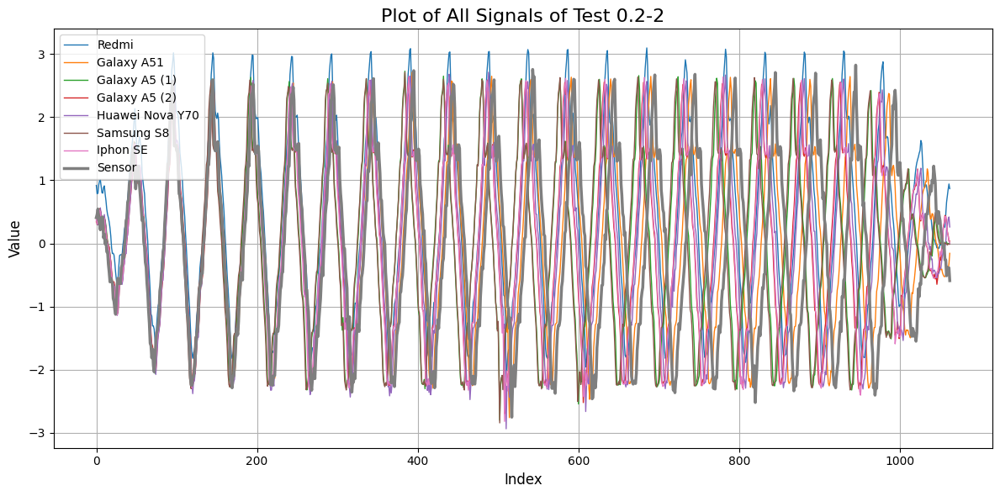

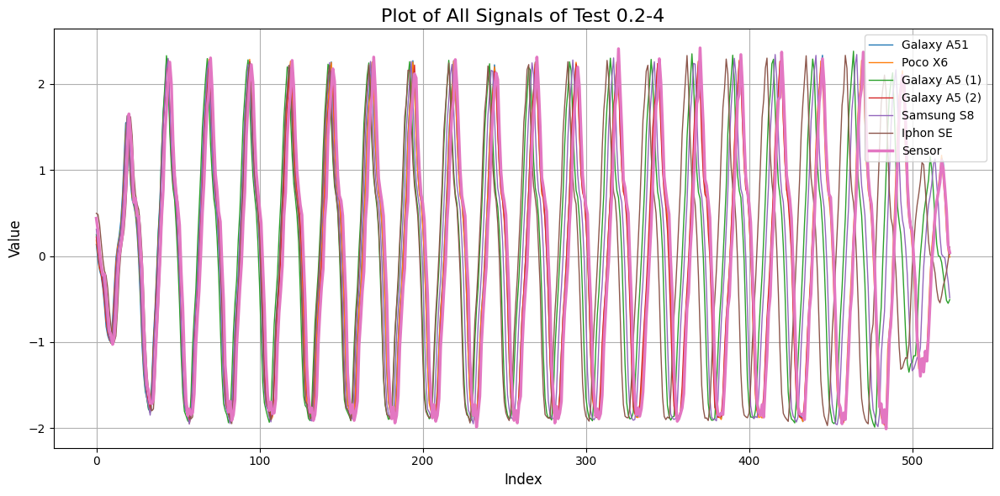

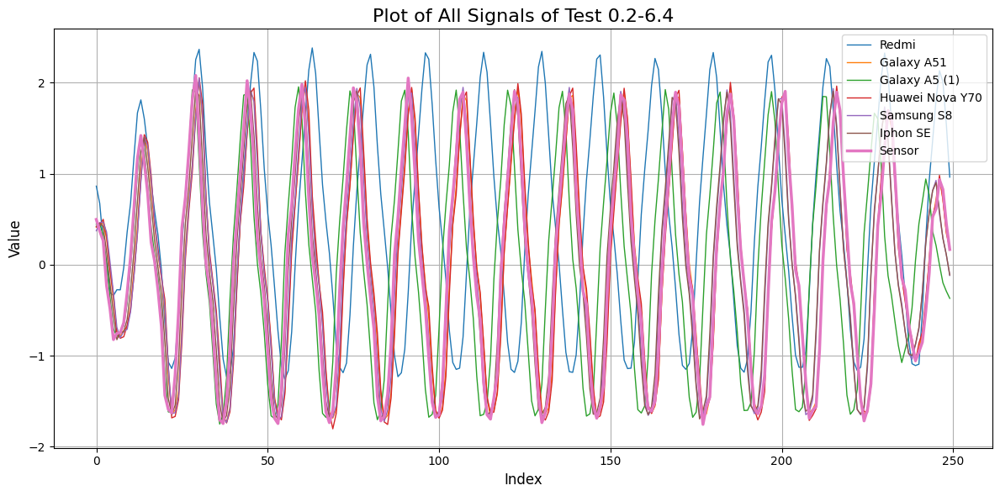

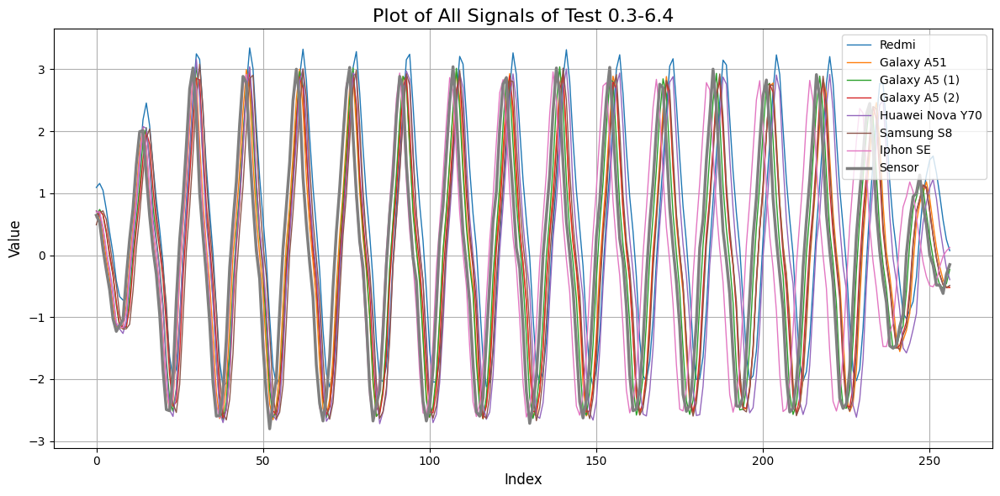

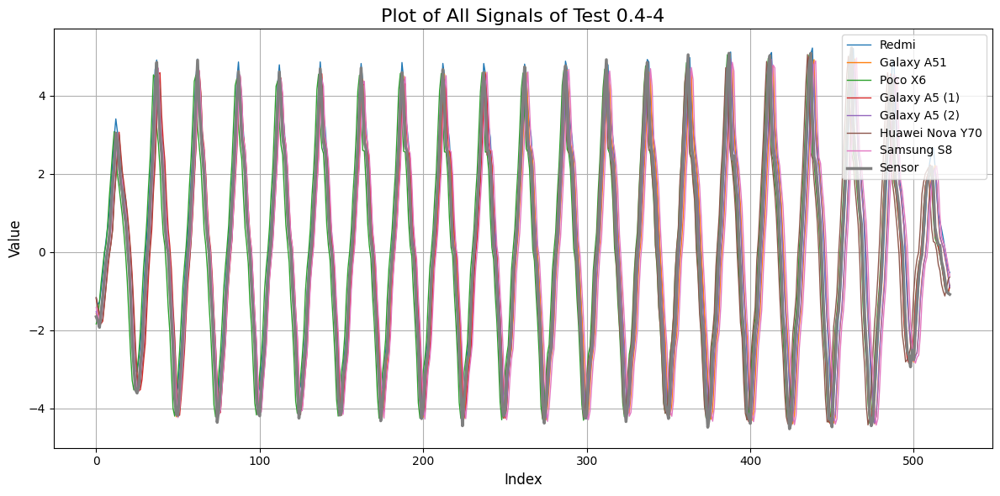

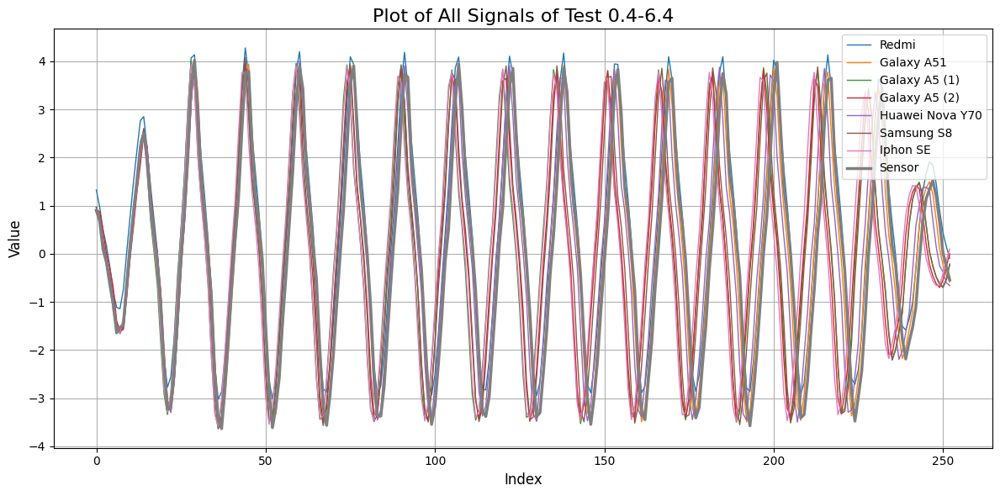

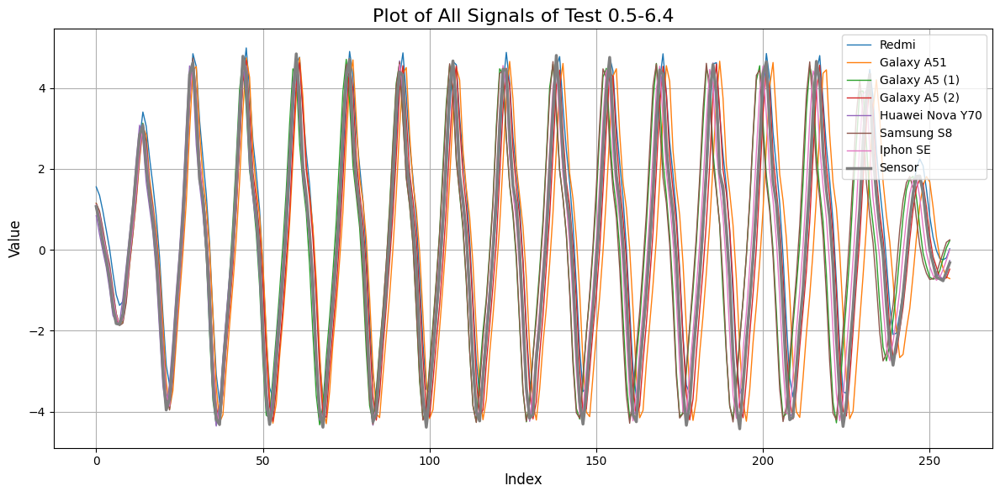

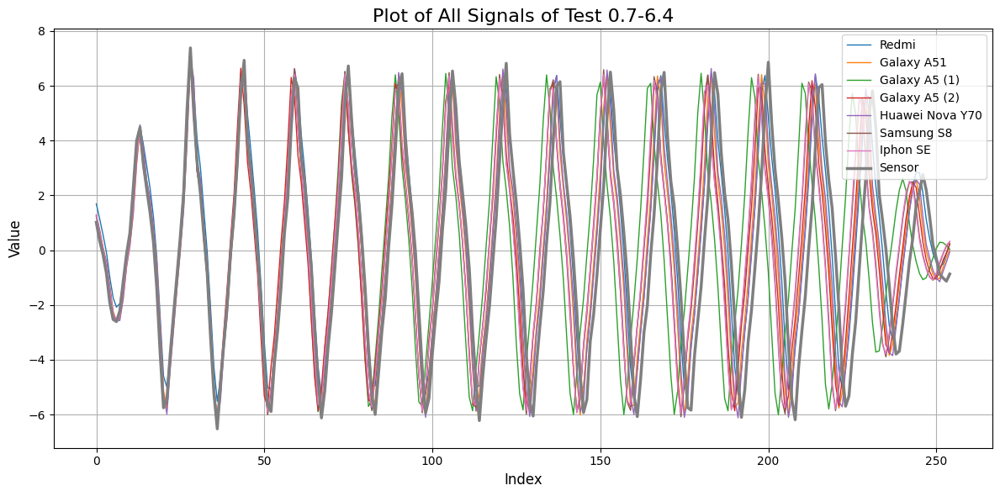

KeyError: 'experiment'

<Figure size 1200x600 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import os

# Directory containing the generated _comb.csv files
directory = os.getcwd()  # Replace with your directory path

# Initialize an empty list to hold DataFrames from each file
dataframes = []

custom_labels = {
    '0': 'Redmi',
    '1': 'Galaxy A51',
    '2': 'Poco X6',
    '3': 'Galaxy A5 (1)',
    '4': 'Galaxy A5 (2)',
    '5': 'Huawei Nova Y70',
    '6': 'Samsung S8',
    '7': 'Iphon SE',
    '11': 'Sensor'
}

mean = {
    '0': 0.233,
    '1': 0.072,
    '2': 0.071,
    '3': 0.183,
    '4': 0.104,
    '5': 0.058,
    '6': 0.066,
    '7': 0.163,
    '11': 0
}

# Loop through all files in the directory to find _comb.csv files
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        # Read each _comb.csv file
        file_path = os.path.join(directory, filename)
        data = pd.read_csv(file_path)
        data.head()

        # Set up the plot
        plt.figure(figsize=(12, 6))

        # Plot each column, distinguishing column 0 (integer)
        for col in data.columns[1:]:  # Skip "Unnamed: 0" (index/identifier)
            if col == '11':  # Check for column 0 as an integer
                plt.plot(data[col]+mean[col], label=custom_labels[col], linewidth=2.5)  # Bolder line for column 0
            else:
                plt.plot(data[col]+mean[col], label=custom_labels[col], linewidth=1)

        # Add labels, legend, and grid
        plt.title('Plot of All Signals of Test '+filename.replace('.csv', ''), fontsize=16)
        plt.xlabel('Time (Second)', fontsize=12)
        plt.ylabel('Acceleration (m/s^2)', fontsize=12)

        # Explicitly call legend()
        plt.legend(loc='best')  # 'best' will automatically choose the best location for the legend
        plt.grid(True)
        plt.tight_layout()

        # Show the plot
        plt.show()




Zoomed FFT plot for Sensor


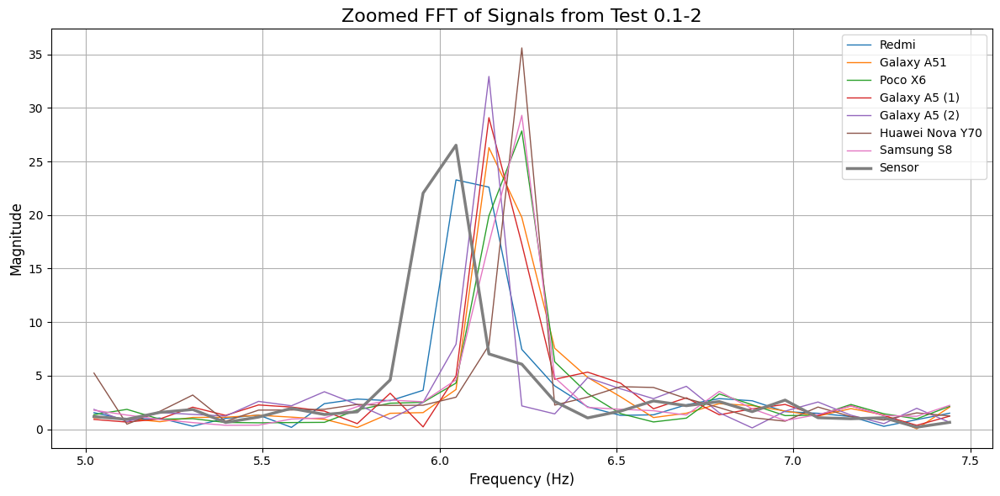

Zoomed FFT plot for Sensor


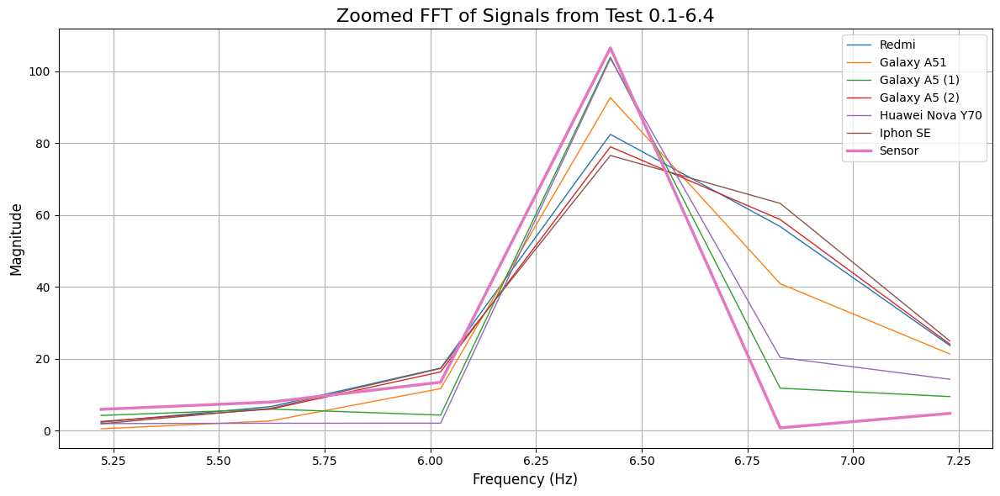

Zoomed FFT plot for Sensor


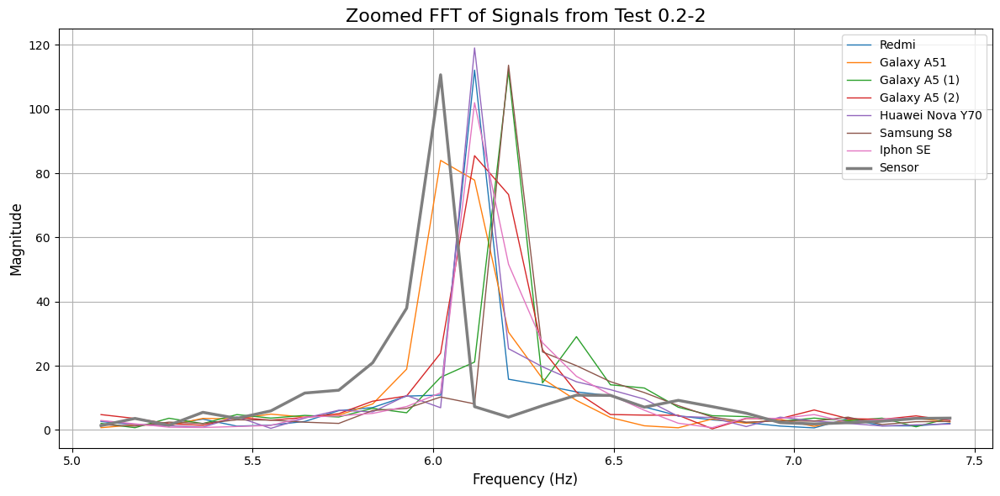

Zoomed FFT plot for Sensor


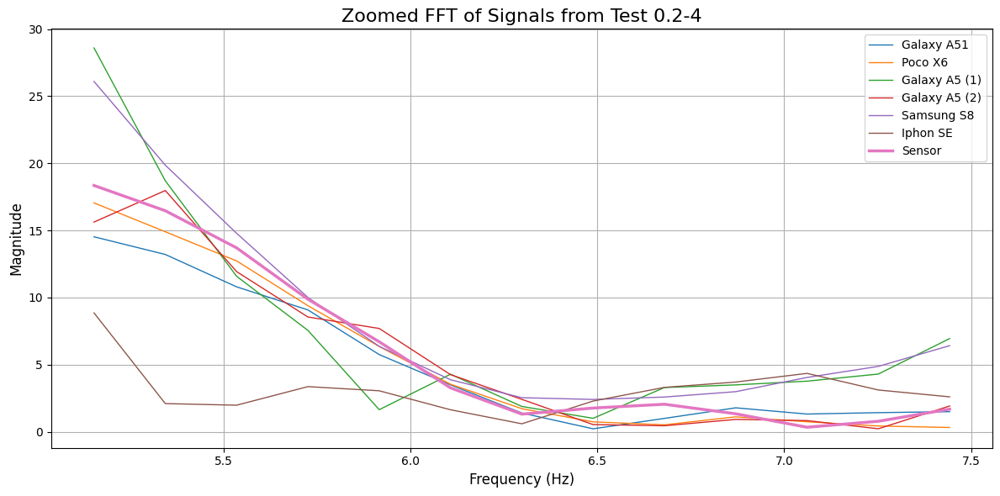

Zoomed FFT plot for Sensor


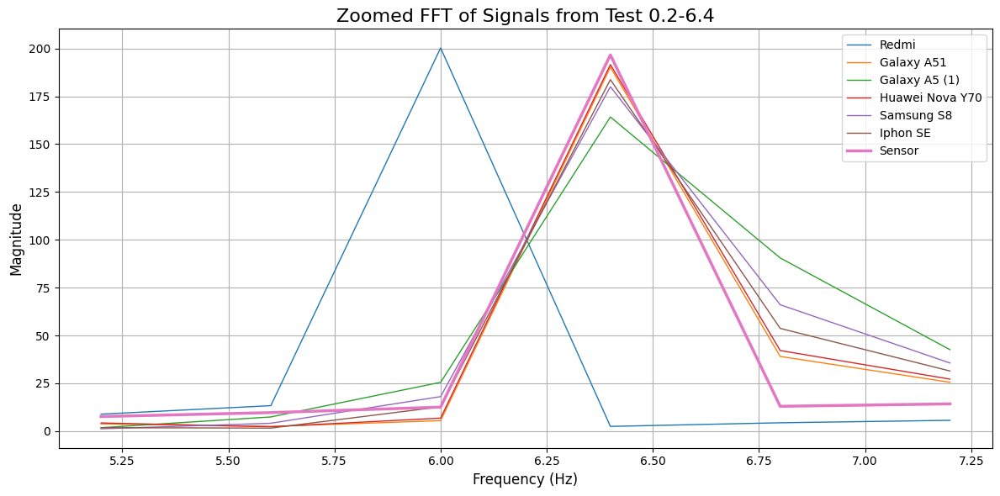

Zoomed FFT plot for Sensor


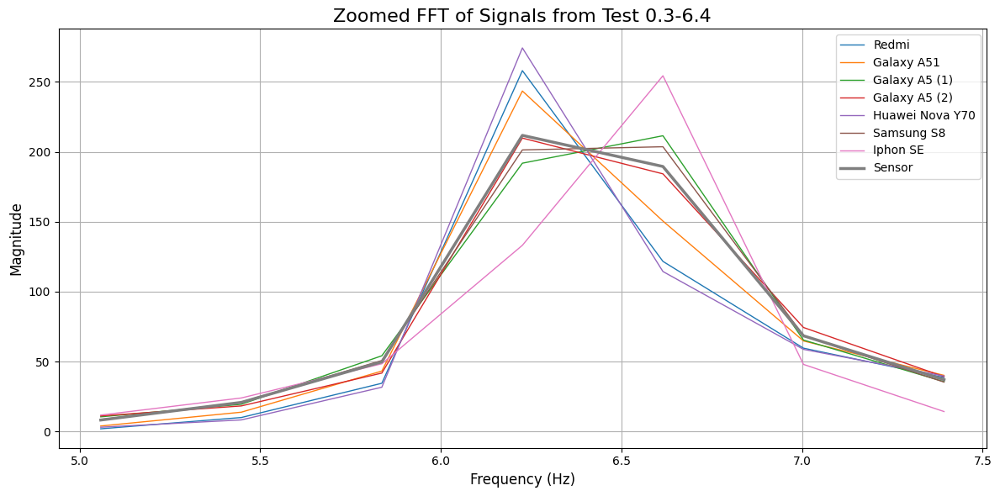

Zoomed FFT plot for Sensor


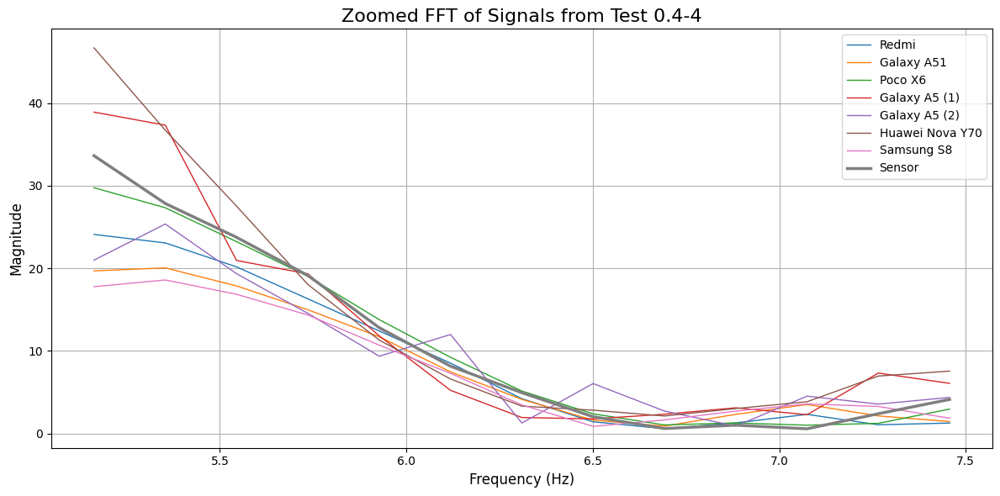

Zoomed FFT plot for Sensor


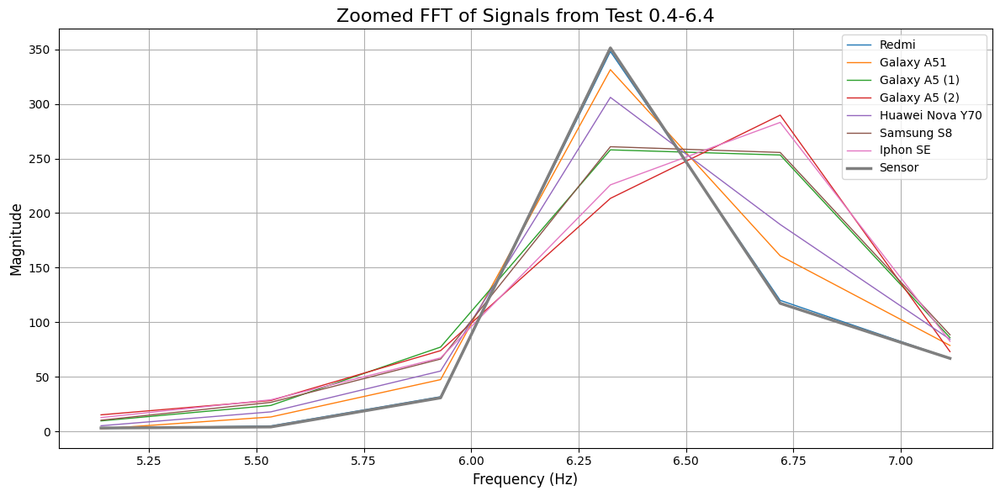

Zoomed FFT plot for Sensor


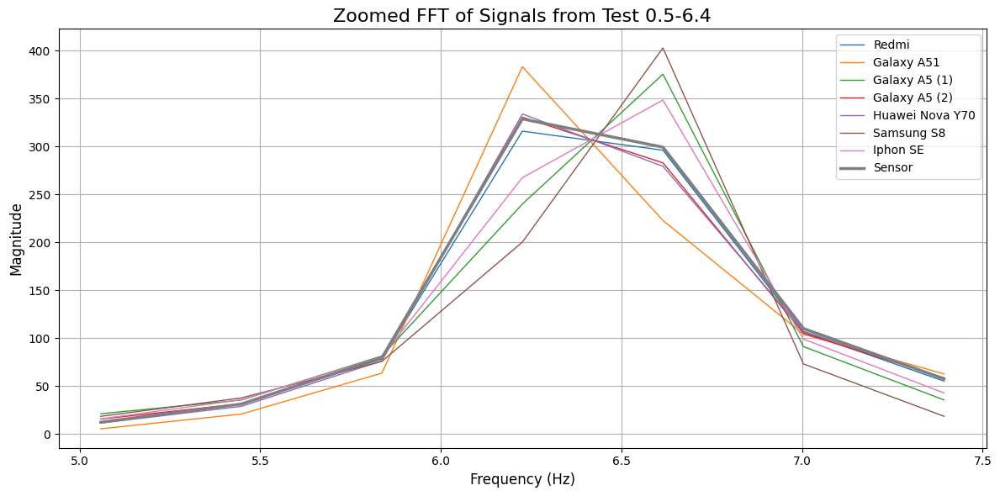

Zoomed FFT plot for Sensor


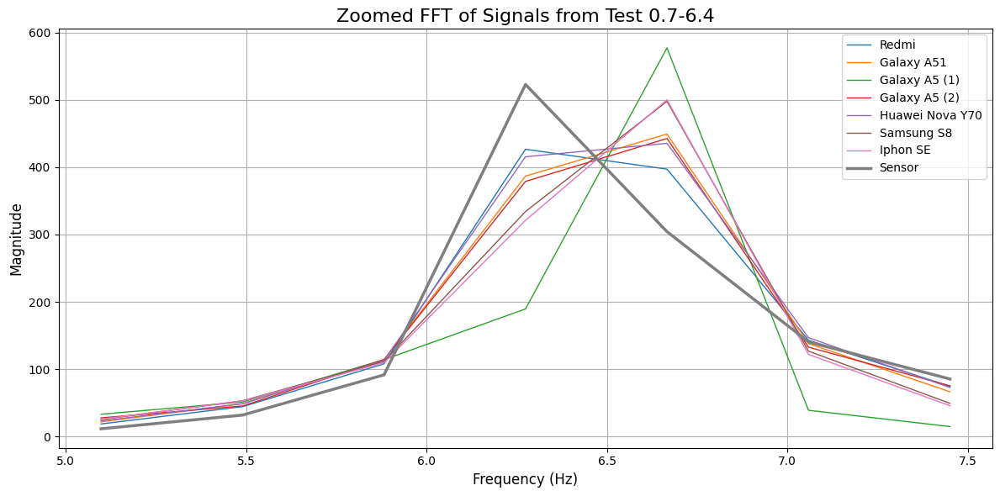

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

# Directory containing the generated _comb.csv files
directory = os.getcwd()  # Replace with your directory path

# Sampling frequency (in Hz)
sampling_frequency = 100

# Initialize an empty list to hold DataFrames from each file
dataframes = []

custom_labels = {
    '0': 'Redmi',
    '1': 'Galaxy A51',
    '2': 'Poco X6',
    '3': 'Galaxy A5 (1)',
    '4': 'Galaxy A5 (2)',
    '5': 'Huawei Nova Y70',
    '6': 'Samsung S8',
    '7': 'Iphon SE',
    '11': 'Sensor'
}

# Loop through all files in the directory to find _comb.csv files
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        # Read each _comb.csv file
        file_path = os.path.join(directory, filename)
        data = pd.read_csv(file_path)
        
        # Set up the plot for the FFT
        plt.figure(figsize=(12, 6))

        # Plot each column, distinguishing column "11" (Sensor column) for FFT
        for col in data.columns[1:]:  # Skip "Unnamed: 0" (index/identifier)
            signal = data[col]
            
            # Compute the FFT of the signal
            fft_signal = np.fft.fft(signal)
            fft_freq = np.fft.fftfreq(len(signal))  # Frequency axis
            
            # Adjust the frequency axis based on the sampling frequency
            positive_freqs = fft_freq[:len(fft_freq)//2] * sampling_frequency  # Multiply by sampling frequency
            positive_fft = np.abs(fft_signal[:len(fft_signal)//2])
            
            # Filter the frequencies and FFT values for the range 4-8 Hz
            zoom_mask = (positive_freqs >= 5) & (positive_freqs <= 7.5)
            zoomed_freqs = positive_freqs[zoom_mask]
            zoomed_fft = positive_fft[zoom_mask]
            
            # Plot FFT (magnitude of FFT for positive frequencies in 4-8 Hz range)
            if col == '11':  # Assuming '11' is for the sensor signal
                plt.plot(zoomed_freqs, zoomed_fft, label=custom_labels[col], linewidth=2.5)  # Bolder line for '11'
                print("Zoomed FFT plot for Sensor")
            else:
                plt.plot(zoomed_freqs, zoomed_fft, label=custom_labels[col], linewidth=1)

        # Add labels, legend, and grid
        plt.title(f'Zoomed FFT of Signals from Test {filename.replace(".csv", "")}', fontsize=16)
        plt.xlabel('Frequency (Hz)', fontsize=12)
        plt.ylabel('Magnitude', fontsize=12)

        # Explicitly call legend()
        plt.legend(loc='best')  # 'best' will automatically choose the best location for the legend
        plt.grid(True)
        plt.tight_layout()

        # Show the plot
        plt.show()


FFT plot for Sensor


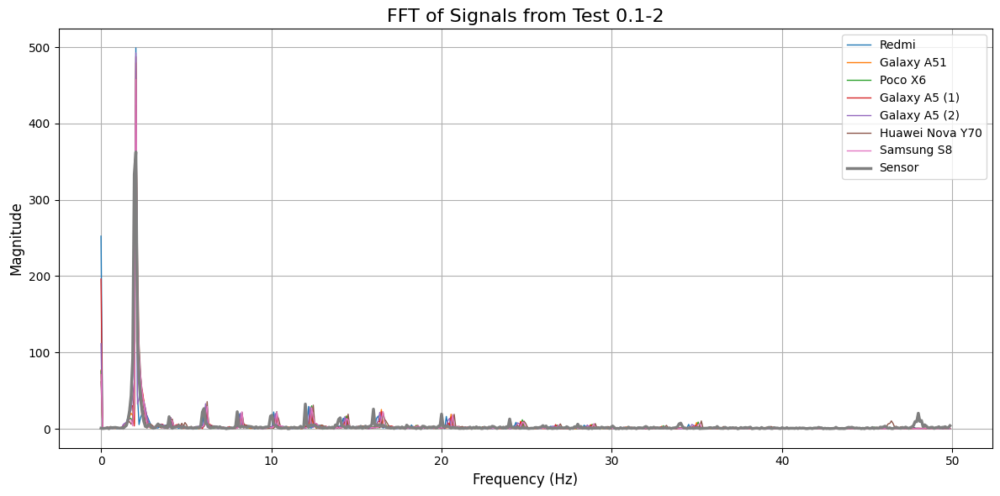

FFT plot for Sensor


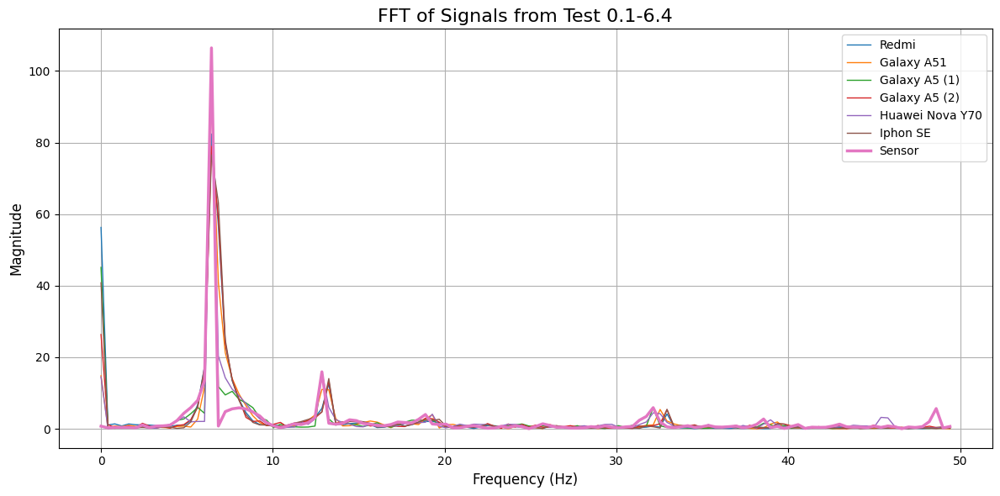

FFT plot for Sensor


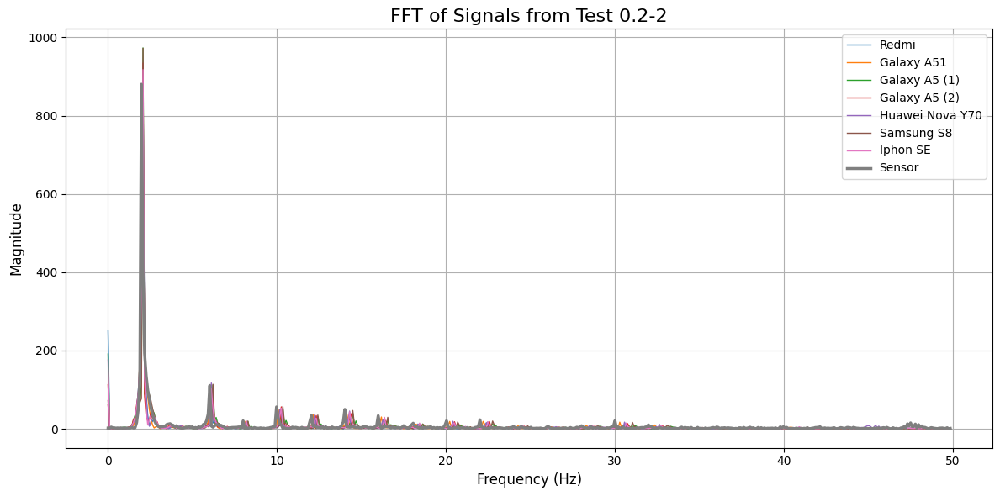

FFT plot for Sensor


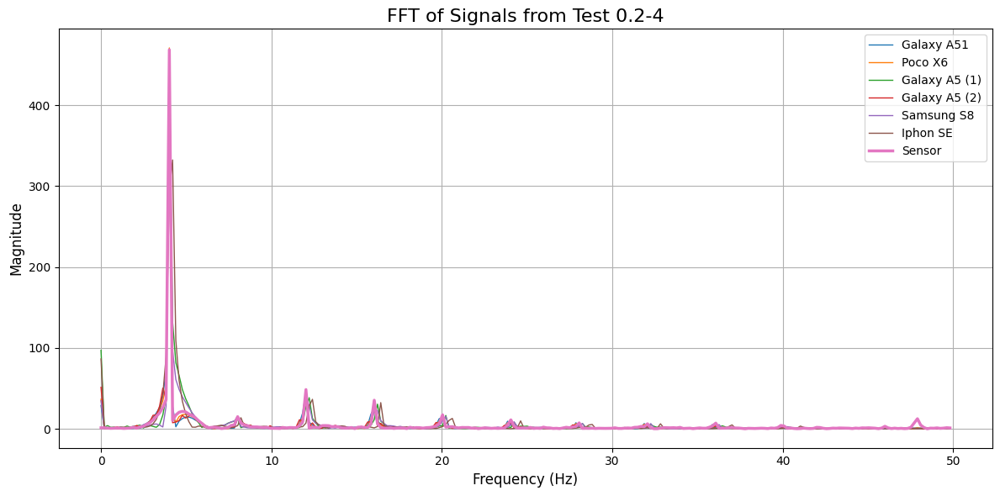

FFT plot for Sensor


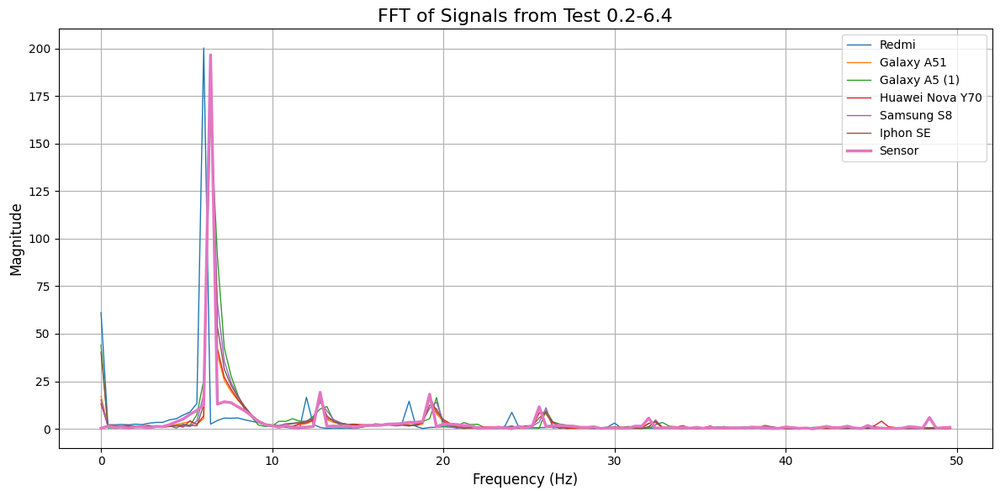

FFT plot for Sensor


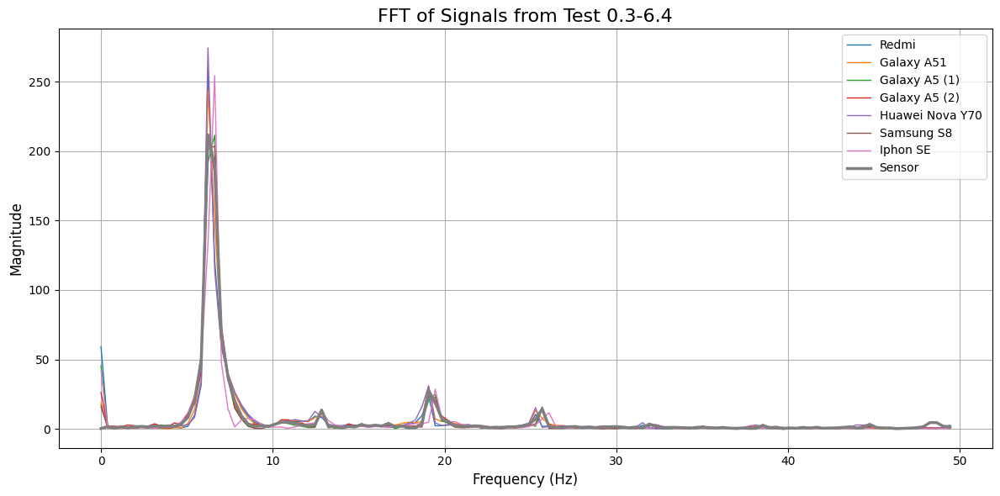

FFT plot for Sensor


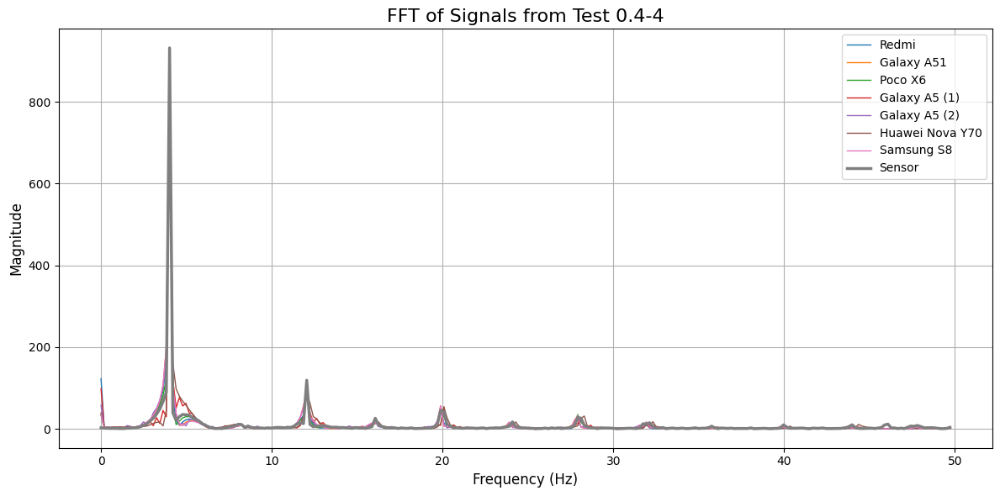

FFT plot for Sensor


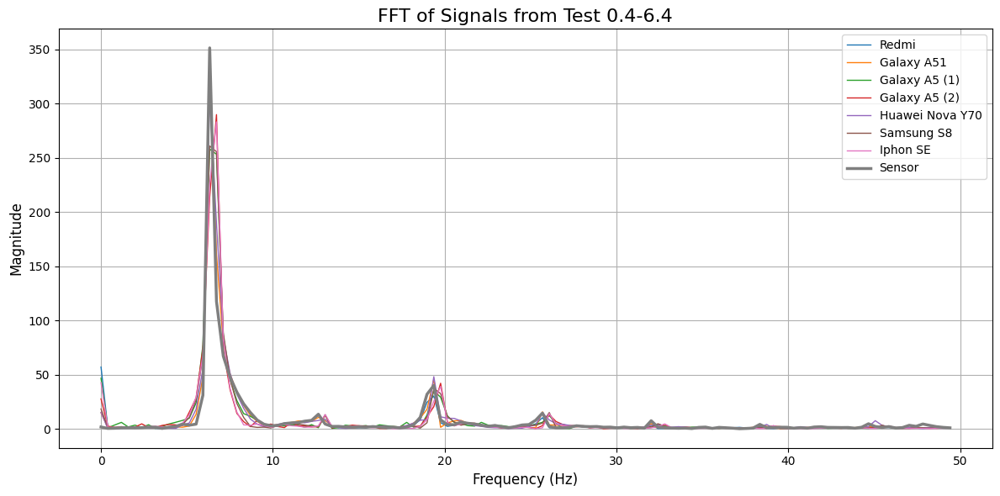

FFT plot for Sensor


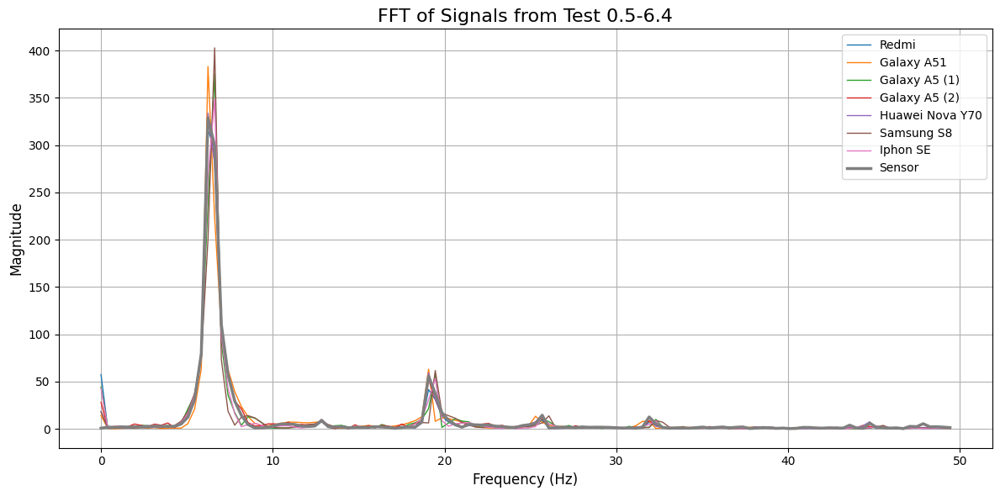

FFT plot for Sensor


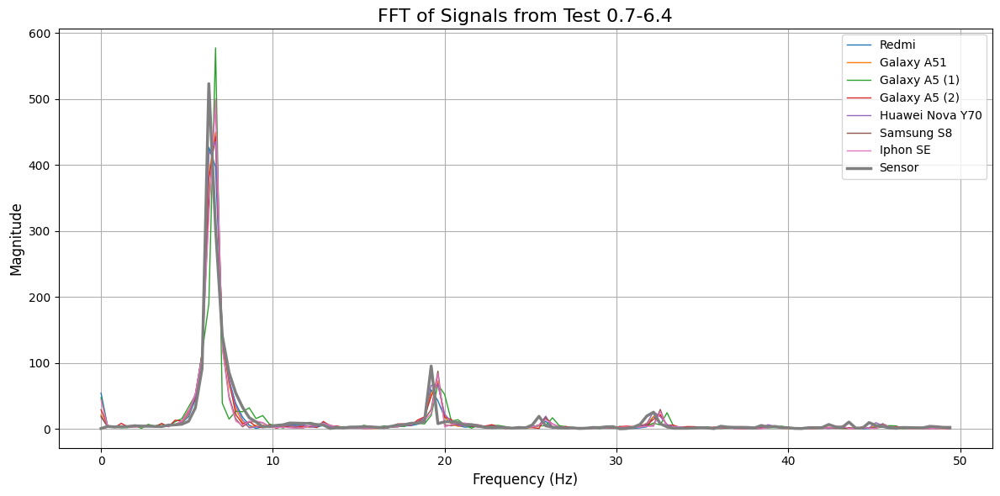

ValueError: complex() arg is a malformed string

<Figure size 1200x600 with 0 Axes>

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

# Directory containing the generated _comb.csv files
directory = os.getcwd()  # Replace with your directory path

# Sampling frequency (in Hz)
sampling_frequency = 100

# Initialize an empty list to hold DataFrames from each file
dataframes = []

custom_labels = {
    '0': 'Redmi',
    '1': 'Galaxy A51',
    '2': 'Poco X6',
    '3': 'Galaxy A5 (1)',
    '4': 'Galaxy A5 (2)',
    '5': 'Huawei Nova Y70',
    '6': 'Samsung S8',
    '7': 'Iphon SE',
    '11': 'Sensor'
}

# Loop through all files in the directory to find _comb.csv files
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        # Read each _comb.csv file
        file_path = os.path.join(directory, filename)
        data = pd.read_csv(file_path)
        
        # Set up the plot for the FFT
        plt.figure(figsize=(12, 6))

        # Plot each column, distinguishing column "11" (Sensor column) for FFT
        for col in data.columns[1:]:  # Skip "Unnamed: 0" (index/identifier)
            signal = data[col]
            
            # Compute the FFT of the signal
            fft_signal = np.fft.fft(signal)
            fft_freq = np.fft.fftfreq(len(signal))  # Frequency axis
            
            # Adjust the frequency axis based on the sampling frequency
            positive_freqs = fft_freq[:len(fft_freq)//2] * sampling_frequency  # Multiply by sampling frequency
            positive_fft = np.abs(fft_signal[:len(fft_signal)//2])
            
            # Plot FFT (magnitude of FFT for positive frequencies)
            if col == '11':  # Assuming '11' is for the sensor signal
                plt.plot(positive_freqs, positive_fft, label=custom_labels[col], linewidth=2.5)  # Bolder line for '11'
                print("FFT plot for Sensor")
            else:
                plt.plot(positive_freqs, positive_fft, label=custom_labels[col], linewidth=1)

        # Add labels, legend, and grid
        plt.title(f'FFT of Signals from Test {filename.replace(".csv", "")}', fontsize=16)
        plt.xlabel('Frequency (Hz)', fontsize=12)
        plt.ylabel('Magnitude', fontsize=12)

        # Explicitly call legend()
        plt.legend(loc='best')  # 'best' will automatically choose the best location for the legend
        plt.grid(True)
        plt.tight_layout()

        # Show the plot
        plt.show()


In [4]:
# Create a dictionary to store results in the format {deviceId: {acceleration-frequency: max_accel_x}}
from sklearn.metrics import mean_squared_error,mean_absolute_error
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

directory = os.getcwd()

results_dict_mse = {}
results_dict_mae = {}
results_dict_max = {}

# Loop through all files in the current directory
for filename in os.listdir(directory):
    if filename.endswith("_normalcomb.csv"):  # Adjust this to match both .xls and .xlsx formats
        file_path = os.path.join(directory, filename)

        # Extract deviceId, acceleration, and frequency from the filename
        file_parts = filename.replace('_normalcomb.csv','').split('-')
    
        device_id = file_parts[2]  # Assuming 'deviceId' is the first part of the filename
        acceleration = file_parts[0]  # Assuming 'acceleration' is the second part of the filename
        frequency = file_parts[1]  # Remove the file extension from frequency

        # Create the column name in the format 'acceleration-frequency'
        column_name = f'{acceleration}-{frequency}'
        data = pd.read_csv(file_path)
        mse = mean_squared_error(data['input'], data['label'])
        mae = mean_absolute_error(data['input'], data['label'])
        max= np.max(data['label']) - np.max(data['input'])


        

        # Populate the dictionary
        if device_id not in results_dict_mse:
            results_dict_mse[device_id] = {}
            results_dict_mae[device_id] = {}
            results_dict_max[device_id] = {}
        results_dict_mse[device_id][column_name] = mse
        results_dict_mae[device_id][column_name] = mae
        results_dict_max[device_id][column_name] = max

# Convert the results dictionary to a DataFrame
results_df_mse = pd.DataFrame.from_dict(results_dict_mse, orient='index')
results_df_mae = pd.DataFrame.from_dict(results_dict_mae, orient='index')
results_df_max = pd.DataFrame.from_dict(results_dict_max, orient='index')

# Print the results in a structured and user-friendly way
print("\n" + "="*50)
print("MSE".center(50))
print("="*50 + "\n")

# Print the results as a table with column alignment and better formatting
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.width', 1000, 'display.colheader_justify', 'center'):
    print(results_df_mse.to_string(float_format="{:,.4f}".format))

print("\n" + "="*50 + "\n")
print("\n" + "="*50)
print("MAE".center(50))
print("="*50 + "\n")

# Print the results as a table with column alignment and better formatting
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.width', 1000, 'display.colheader_justify', 'center'):
    print(results_df_mae.to_string(float_format="{:,.4f}".format))

print("\n" + "="*50 + "\n")

print("MAX".center(50))
print("="*50 + "\n")

# Print the results as a table with column alignment and better formatting
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.width', 1000, 'display.colheader_justify', 'center'):
    print(results_df_max.to_string(float_format="{:,.4f}".format))

print("\n" + "="*50 + "\n")





                       MSE                        

   0.1-2  0.1-6.4  0.2-2  0.2-6.4  0.3-6.4  0.4-4  0.4-6.4  0.5-6.4  0.7-6.4  0.2-4
0 0.2578  0.8239  1.8578  2.7519   3.2301  0.2788  0.0897   0.4718   1.3047     NaN
1 0.9237  0.4312  0.5881  0.1318   0.9588  0.9117  0.1709   3.1603   3.2428  0.1489
2 0.9673     NaN     NaN     NaN      NaN  0.7578     NaN      NaN      NaN  0.1418
3 0.7746  0.1318  4.2551  1.1271   0.5341  0.4899  4.8628   1.9924  16.5544  1.9308
4 0.7296  0.7251  2.7717     NaN   1.2080  0.6050  4.3061   0.5745   6.5145  0.0966
5 1.0579  0.1050  1.9756  0.1652   2.9251  0.7066  0.7725   0.0755   2.2906     NaN
6 1.0386     NaN  4.3036  0.1876   1.8555  2.2301  3.5340   2.3097   7.7198  1.0470
7    NaN  0.5365  2.7312  0.1374   0.7155     NaN  5.7878   0.3853   8.0757  3.0112



                       MAE                        

   0.1-2  0.1-6.4  0.2-2  0.2-6.4  0.3-6.4  0.4-4  0.4-6.4  0.5-6.4  0.7-6.4  0.2-4
0 0.3927  0.7634  1.0541  1.3411   1.6083  0.4136  0

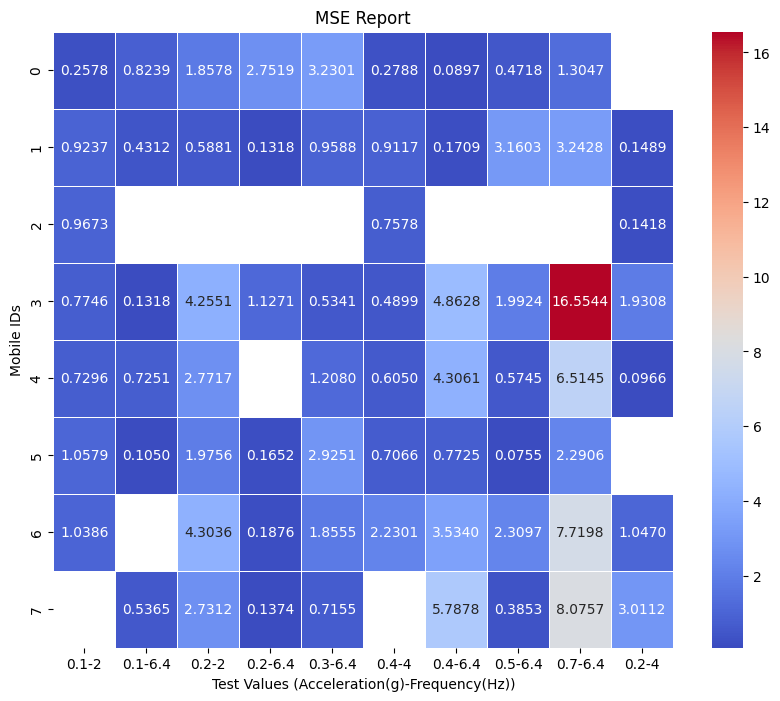

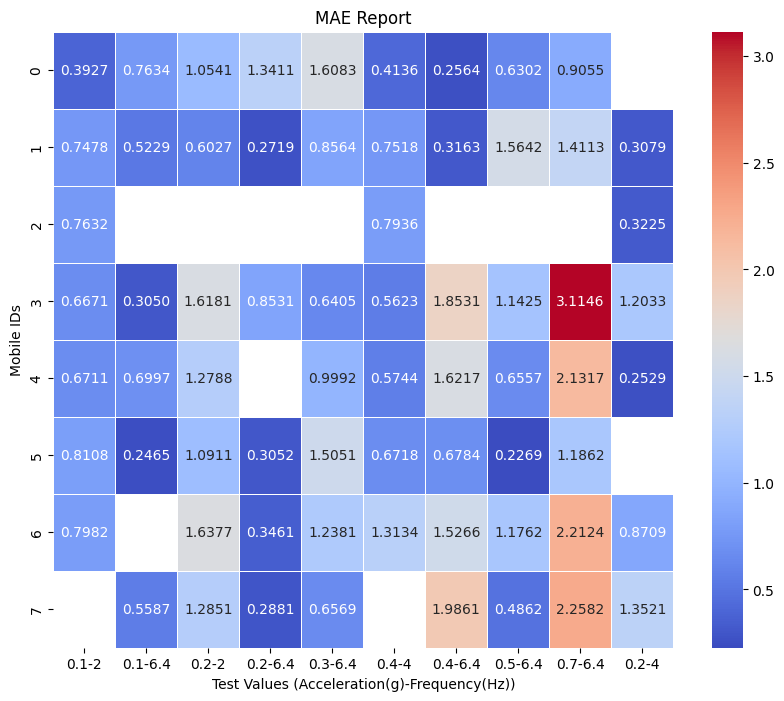

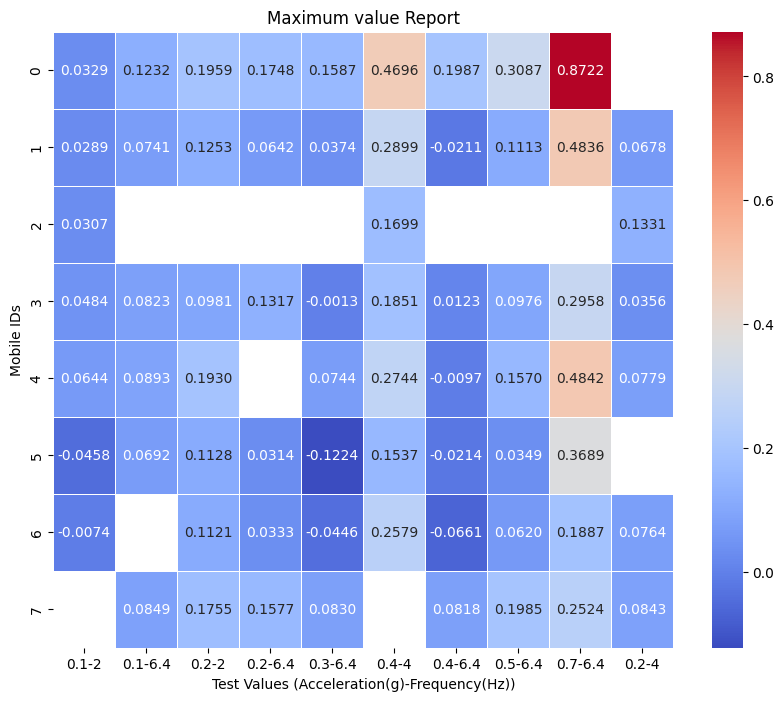

In [5]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the heatmap plotting function
def plot_heatmap(df, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(df, annot=True, cmap="coolwarm", fmt=".4f", linewidths=.5)
    plt.title(title)
    plt.xlabel("Test Values (Acceleration(g)-Frequency(Hz))")
    plt.ylabel("Mobile IDs")
    plt.show()

# Plot heatmap for MAX ACCELERATION REPORT
plot_heatmap(results_df_mse, 'MSE Report')

# Plot heatmap for MAX FFT INDEX REPORT
plot_heatmap(results_df_mae, 'MAE Report')

# Plot heatmap for AVERAGE ACCELERATION REPORT
plot_heatmap(results_df_max, 'Maximum value Report')

